In [1]:
import os
import urllib
import cv2
import numpy as np
import pixellib
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt
import matplotlib as mpl 

(960, 720, 3)


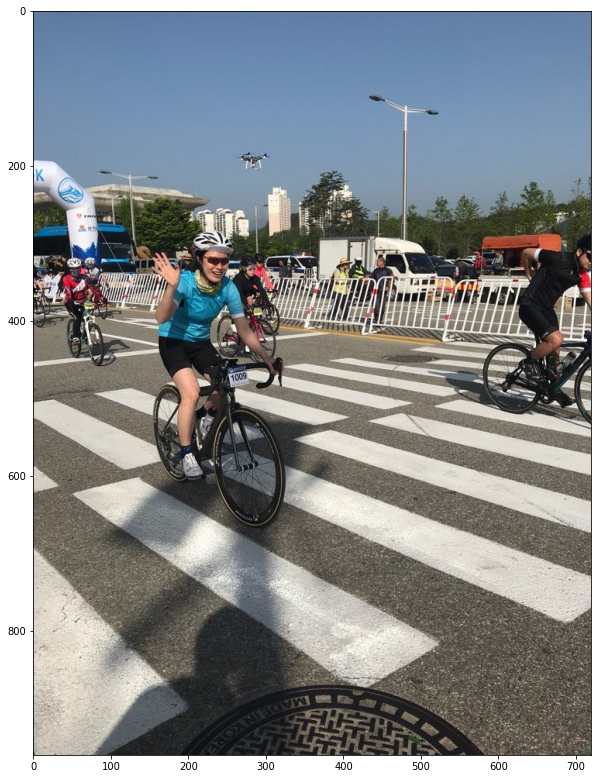

In [2]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/sue.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.figure(figsize=(10,20))
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [3]:
# 저장할 파일 이름을 결정합니다
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models'
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5')

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5'

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file)

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f23861093a0>)

In [4]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [5]:
segvalues, output = model.segmentAsPascalvoc(img_path) #PASCAL VOC 데이터로 학습된 모델을 이용


In [6]:
type(segvalues)
segvalues

{'class_ids': array([ 0,  2,  7, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [7]:
output.shape

(960, 720, 3)

In [8]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

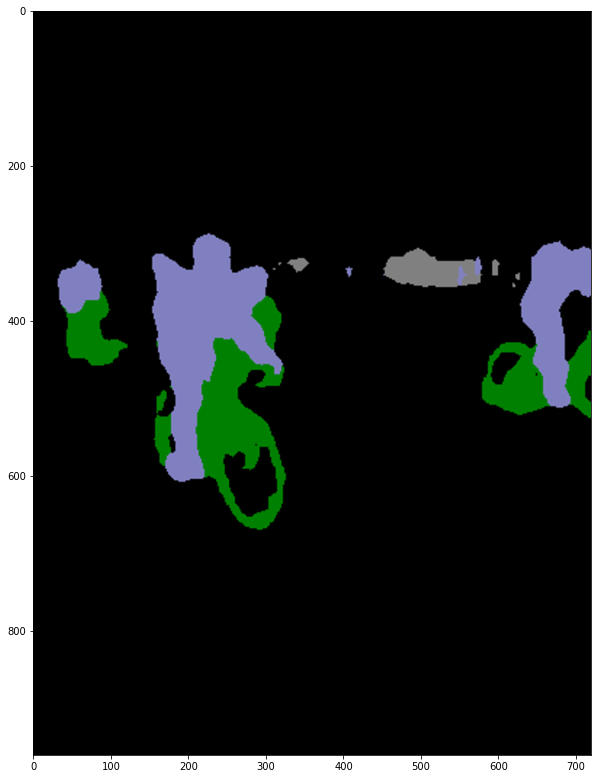

In [9]:
plt.figure(figsize=(10,20))
plt.imshow(output)
plt.show()

In [10]:
segvalues #class id에 해당하는 이미지 속 물체에 해당하는 클래스 번호가 나온다. 0 - 배경 / 2 - 자전거 / 7 - / 자동차  /15 - 사람 

{'class_ids': array([ 0,  2,  7, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [11]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
bicycle
car
person


In [12]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [13]:
colormap[15]

array([192, 128, 128])

In [14]:
seg_color = (128,128,192)  #output 이미지가 BGR 순서 / colormap은 RGB 순서

(960, 720)


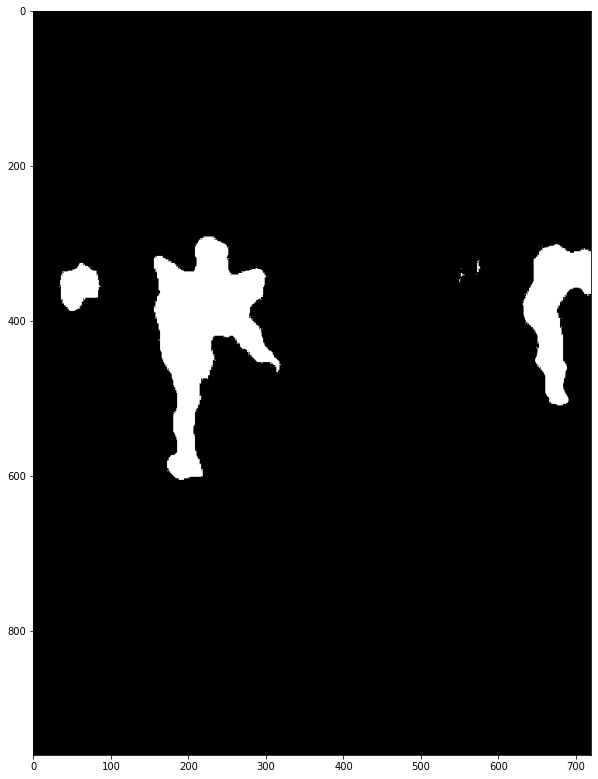

In [15]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.figure(figsize=(10,20))
plt.imshow(seg_map, cmap='gray')
plt.show()

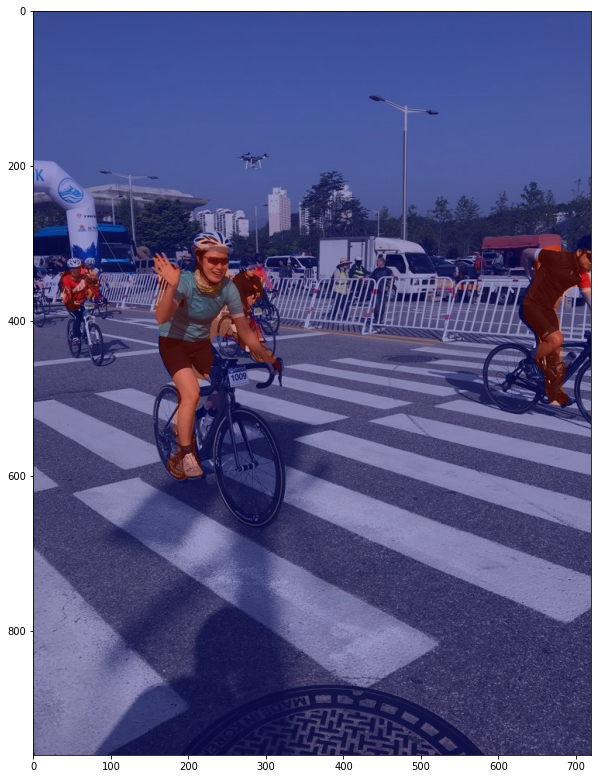

In [16]:
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255  

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.

"""cv2.addWeighted(src1, alpha, src2, beta, gamma, dst=None, dtype=None) 

• src1: (입력) 첫 번째 영상
• alpha: 첫 번째 영상 가중치
• src2: 두 번째 영상. src1과 같은 크기 & 같은 타입
• beta: 두 번째 영상 가중치
• gamma: 결과 영상에 추가적으로 더할 값
• dst: 가중치 합 결과 영상
• dtype: 출력 영상(dst)의 타입
"""
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.figure(figsize=(10,20))
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

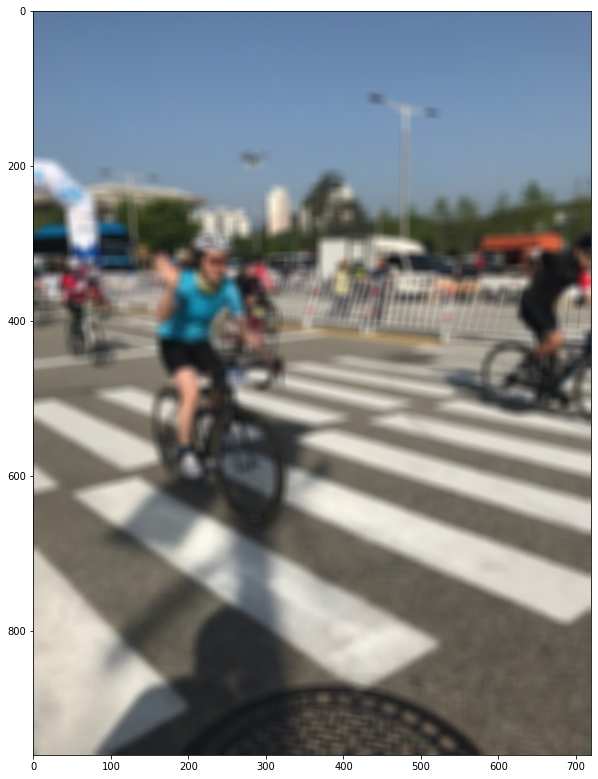

In [17]:
# (13,13)은 blurring kernel size를 뜻합니다


"""cv2.blur 는  LPF(low pass filters)로 처리함. 
high-pass filters (HPF)는 이미지에서 엣지를 더욱 찾아준다. 
"""
img_orig_blur = cv2.blur(img_orig, (13,13))  
plt.figure(figsize=(10,20))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

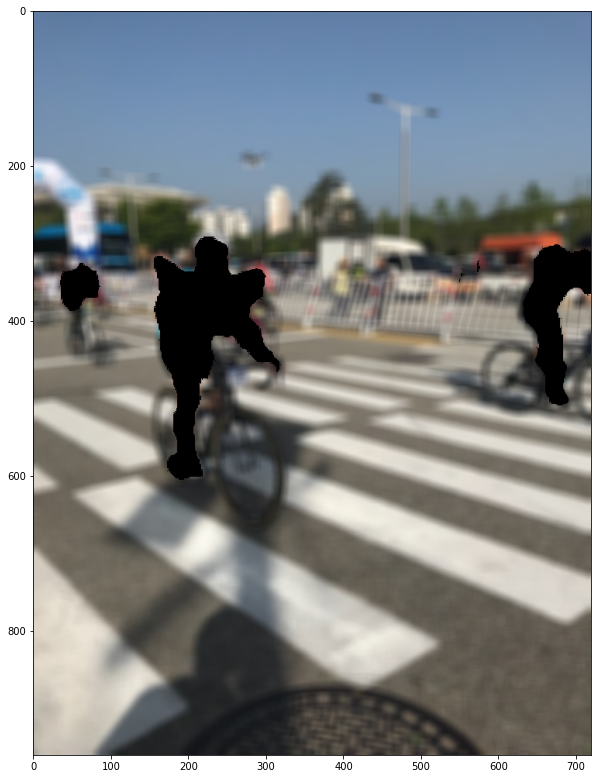

In [18]:
"""
bitwise_and  - mask 영역에서 서로 공통으로 겹치는 부분 출력
bitwise_or - mask 영역의 두 이미지를 합쳐버림
bitsise_xor - 모두 해당되거나 모두 해당되지 않는 영역을 제외한 부분. 한 이미지만 mask 영역인  부분 채택. 
bitwise_not  - 이미지 반전시켜줌. not을 쓰는 경우에는 이미지를 한개만 넣어준다.

"""



img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(10,20))
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

In [24]:
print(mpl.__version__)
print(mpl.__file__)
print(mpl.get_configdir())
mpl.get_cachedir()

3.4.3
/opt/conda/lib/python3.9/site-packages/matplotlib/__init__.py
/aiffel/.config/matplotlib


'/aiffel/.cache/matplotlib'

In [25]:
import matplotlib.font_manager as fm
     
font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')

# ttf 폰트 전체개수
print(len(font_list))


103


In [26]:
[(f.name, f.fname) for f in fm.fontManager.ttflist if 'Nanum' in f.name]

[('NanumBarunGothic',
  '/usr/share/fonts/truetype/nanum/NanumBarunGothicBold.ttf'),
 ('NanumGothic', '/usr/share/fonts/truetype/nanum/NanumGothicBold.ttf'),
 ('NanumSquare', '/usr/share/fonts/truetype/nanum/NanumSquareB.ttf'),
 ('NanumGothic', '/usr/share/fonts/truetype/nanum/NanumGothic.ttf'),
 ('NanumSquareRound', '/usr/share/fonts/truetype/nanum/NanumSquareRoundR.ttf'),
 ('NanumMyeongjo', '/usr/share/fonts/truetype/nanum/NanumMyeongjoBold.ttf'),
 ('NanumMyeongjo', '/usr/share/fonts/truetype/nanum/NanumMyeongjo.ttf'),
 ('NanumBarunGothic', '/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf'),
 ('NanumSquare', '/usr/share/fonts/truetype/nanum/NanumSquareR.ttf'),
 ('NanumSquareRound', '/usr/share/fonts/truetype/nanum/NanumSquareRoundB.ttf')]

In [27]:
path = '/usr/share/fonts/truetype/nanum/NanumSquareR.ttf'

['NanumGothic']


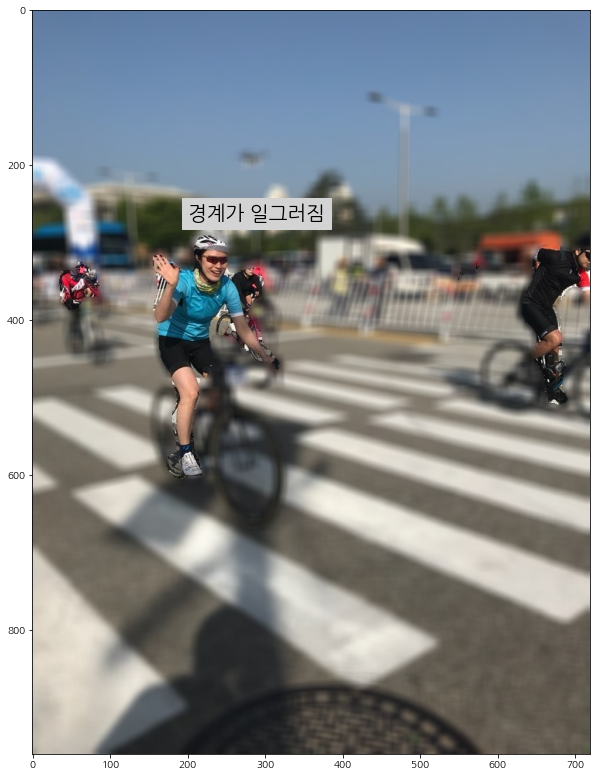

In [28]:

img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.figure(figsize=(10,20))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.text(200, 270, '경계가 일그러짐', fontsize=20, bbox=dict(boxstyle='square', color='lightgray'))
plt.rc('font', family='NanumGothic')
print(plt.rcParams['font.family'])
plt.show()

(720, 960, 3)


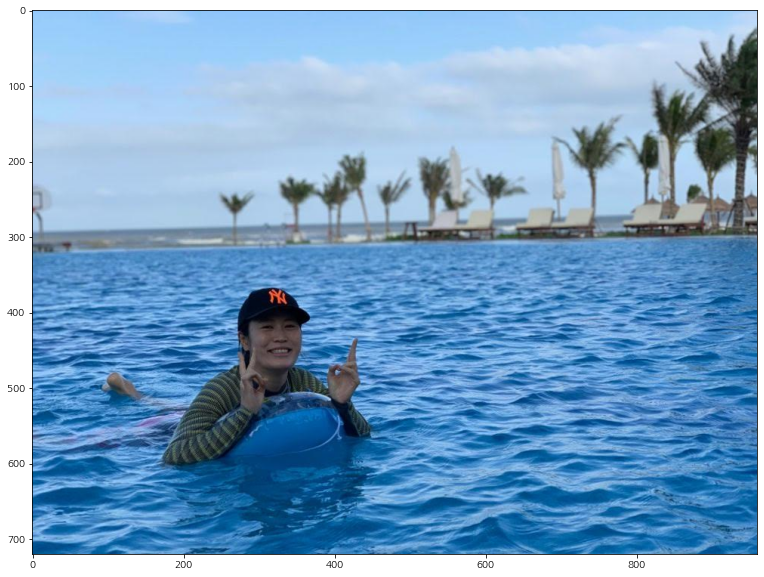

In [29]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/inpool.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [30]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [31]:
segvalues, output = model.segmentAsPascalvoc(img_path) #PASCAL VOC 데이터로 학습된 모델을 이용

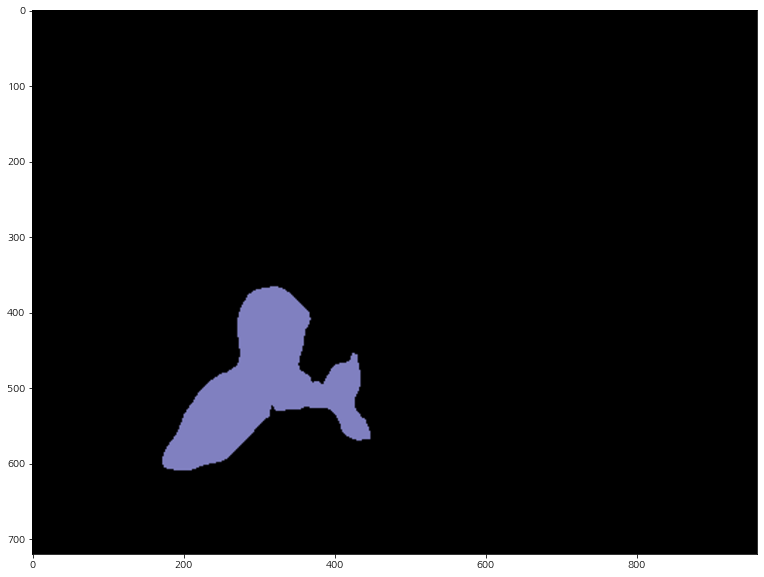

In [33]:
plt.figure(figsize=(20,10))
plt.imshow(output)
plt.show()

In [34]:
segvalues #class id에 해당하는 이미지 속 물체에 해당하는 클래스 번호가 나온다. 0 - 배경 / 2 - 자전거 / 7 - / 자동차  /15 - 사람 

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [35]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [36]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [37]:
colormap[15]

array([192, 128, 128])

In [38]:
seg_color = (128,128,192)  #output 이미지가 BGR 순서 / colormap은 RGB 순서

(720, 960)


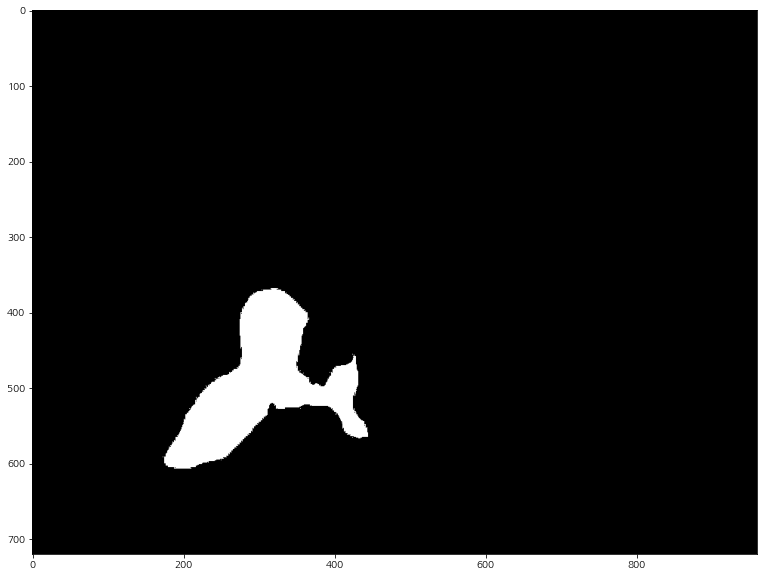

In [39]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.figure(figsize=(20,10))
plt.imshow(seg_map, cmap='gray')
plt.show()

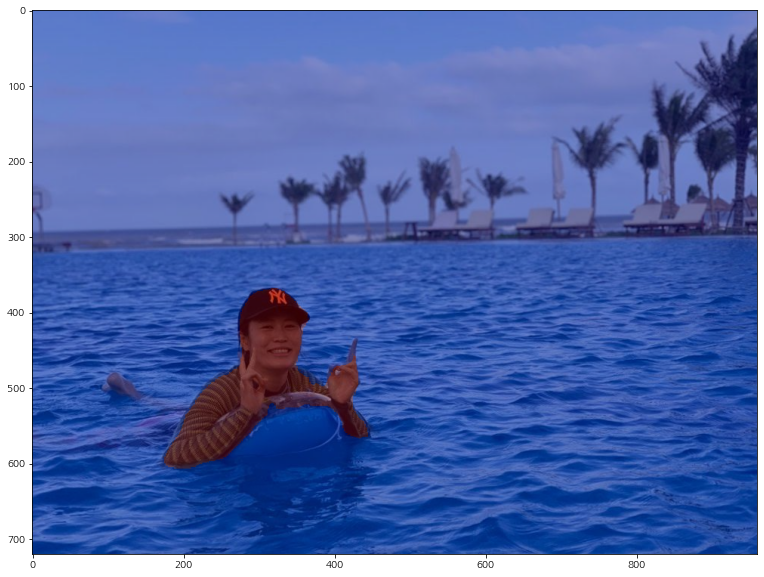

In [40]:
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255  

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.

"""cv2.addWeighted(src1, alpha, src2, beta, gamma, dst=None, dtype=None) 

• src1: (입력) 첫 번째 영상
• alpha: 첫 번째 영상 가중치
• src2: 두 번째 영상. src1과 같은 크기 & 같은 타입
• beta: 두 번째 영상 가중치
• gamma: 결과 영상에 추가적으로 더할 값
• dst: 가중치 합 결과 영상
• dtype: 출력 영상(dst)의 타입
"""
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

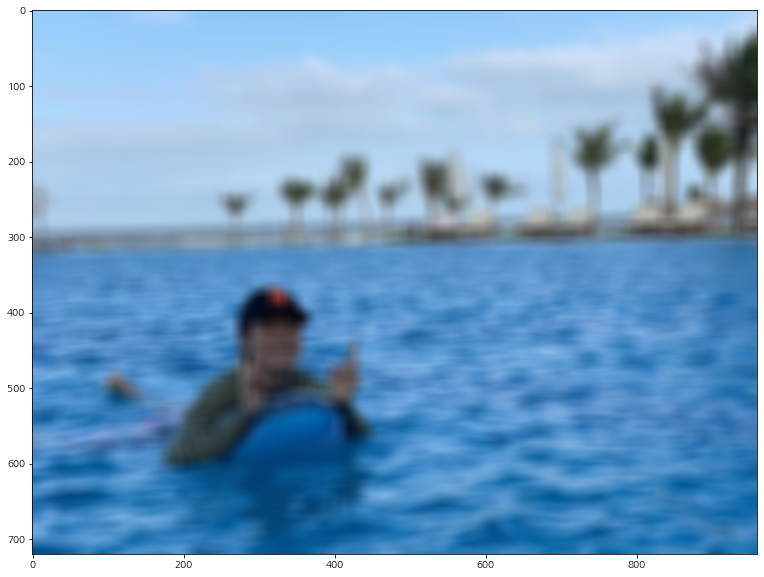

In [42]:

"""cv2.blur 는  LPF(low pass filters)로 처리함. 
high-pass filters (HPF)는 이미지에서 엣지를 더욱 찾아준다. 
"""
img_orig_blur = cv2.blur(img_orig, (20,20))  
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

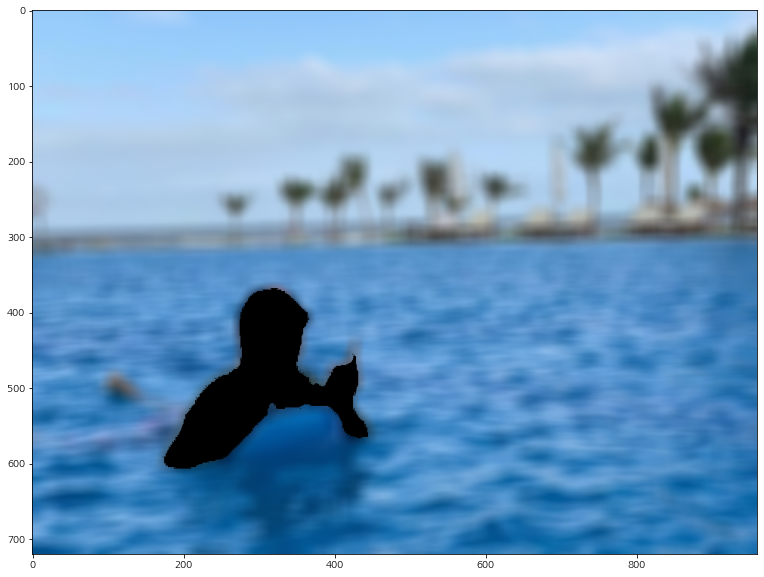

In [43]:
"""
bitwise_and  - mask 영역에서 서로 공통으로 겹치는 부분 출력
bitwise_or - mask 영역의 두 이미지를 합쳐버림
bitsise_xor - 모두 해당되거나 모두 해당되지 않는 영역을 제외한 부분. 한 이미지만 mask 영역인  부분 채택. 
bitwise_not  - 이미지 반전시켜줌. not을 쓰는 경우에는 이미지를 한개만 넣어준다.

"""



img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

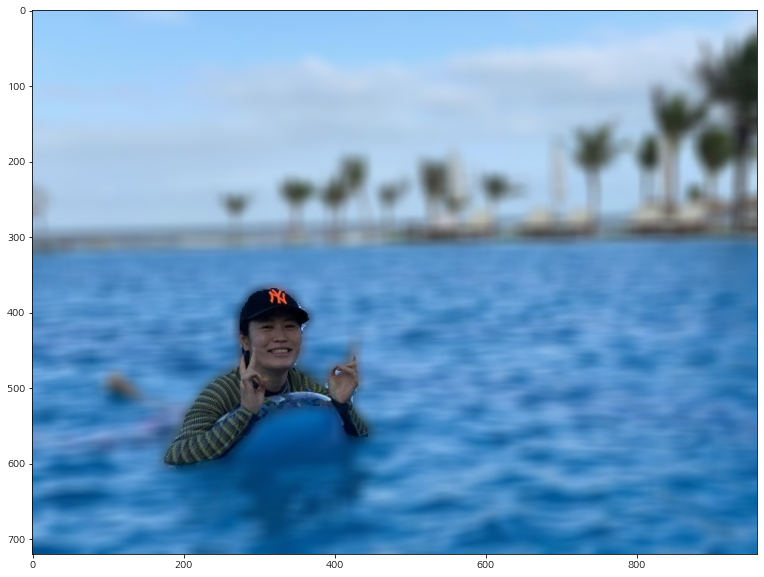

In [44]:

img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
#plt.text(200, 270, '경계가 일그러짐', fontsize=20, bbox=dict(boxstyle='square', color='lightgray'))
#plt.rc('font', family='NanumGothic')
#print(plt.rcParams['font.family'])
plt.show()

(442, 700, 3)


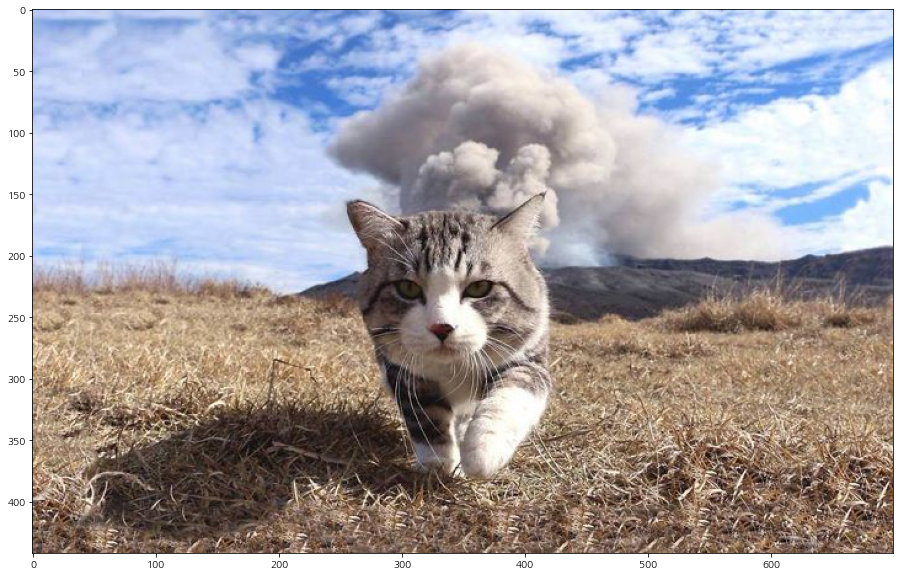

In [45]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/cat_running.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()


In [46]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [47]:
segvalues, output = model.segmentAsPascalvoc(img_path) 

In [48]:
type(segvalues)
segvalues   #class id가 8번 고양이로 나온다.

{'class_ids': array([0, 8]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

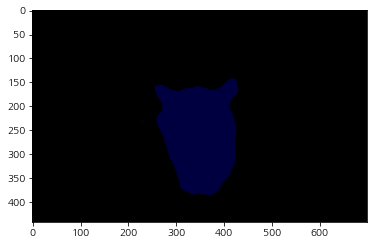

In [49]:

plt.imshow(output)
plt.show()

In [50]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])
    
  

background
cat


In [51]:

# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [52]:
print(colormap[8])
seg_color = (0,0,64)
seg_color

[64  0  0]


(0, 0, 64)

(442, 700)


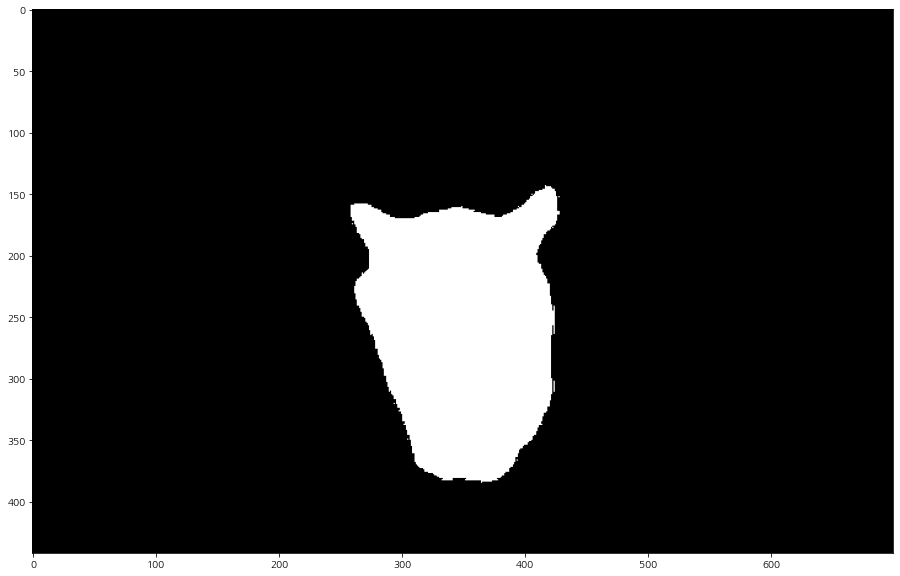

In [53]:
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.figure(figsize=(20,10))
plt.imshow(seg_map, cmap='gray')
plt.show()

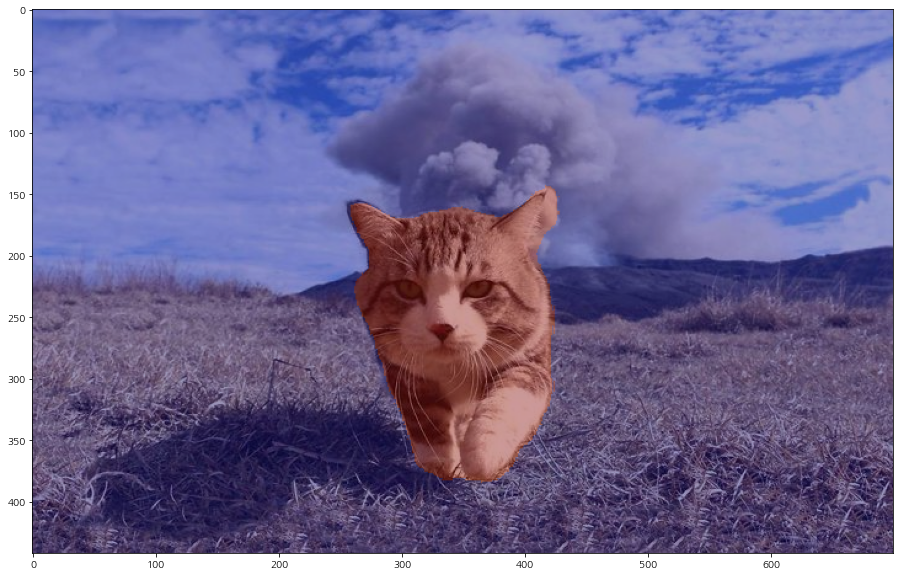

In [54]:
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255  

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

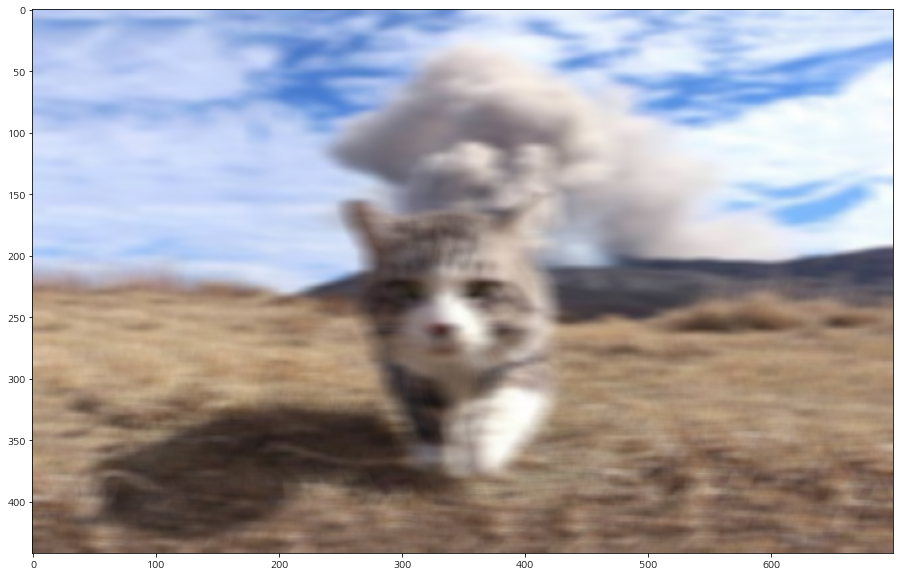

In [65]:
img_orig_blur = cv2.blur(img_orig, (20,5))  
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

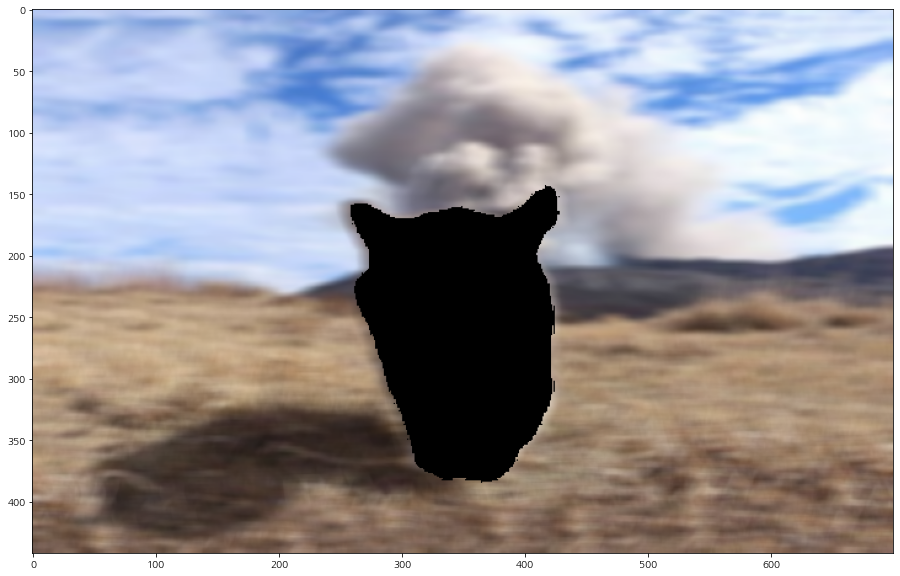

In [66]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

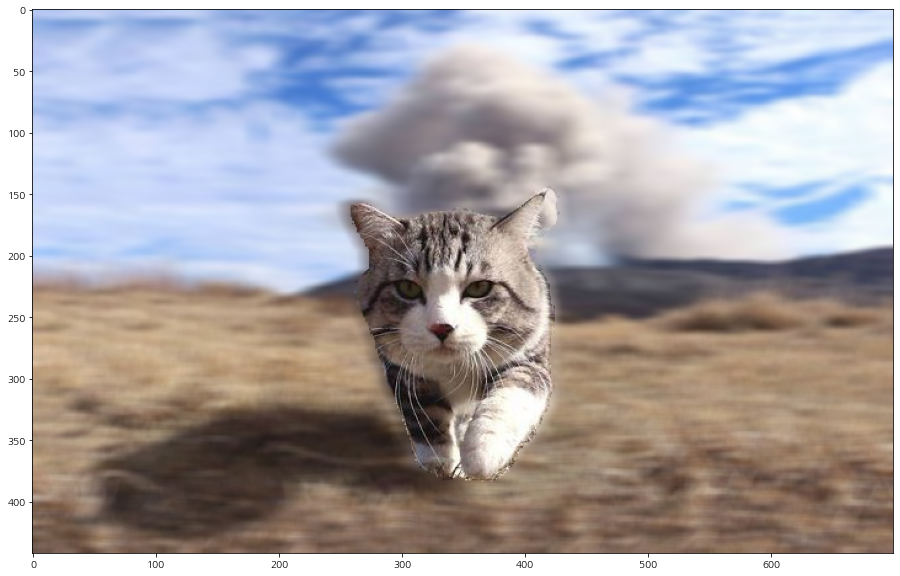

In [67]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.figure(figsize=(20,10))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

(1198, 821, 3)


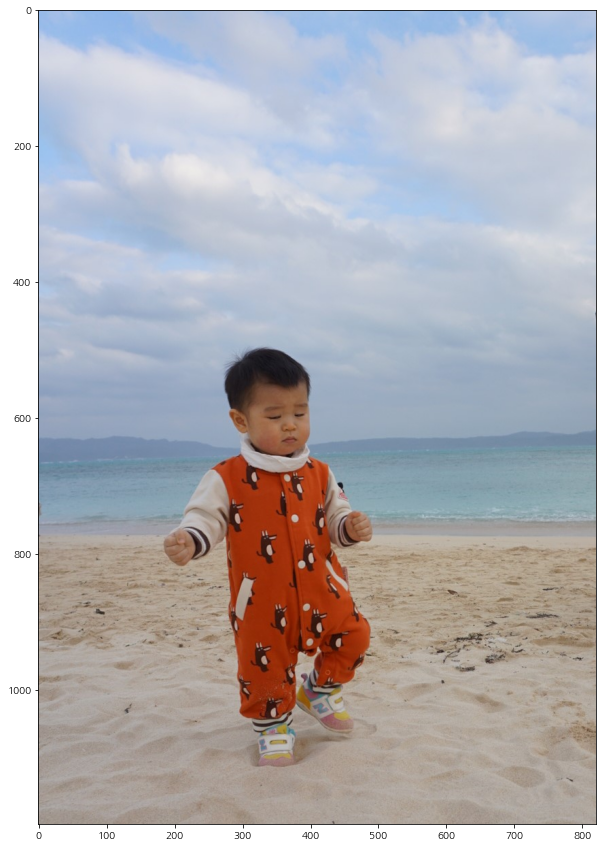

In [176]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/myson8.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)
plt.figure(figsize=(10,20))
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [177]:
model = semantic_segmentation()
model.load_pascalvoc_model(model_file)

In [178]:
segvalues, output = model.segmentAsPascalvoc(img_path) #PASCAL VOC 데이터로 학습된 모델을 이용

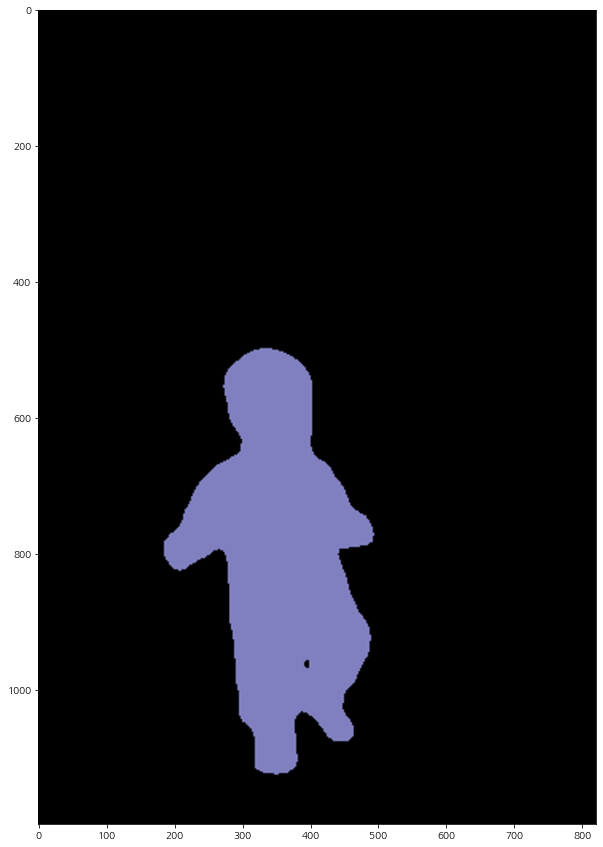

In [179]:
plt.figure(figsize=(10,20))
plt.imshow(output)
plt.show()

In [180]:
type(segvalues)
segvalues

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [181]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [182]:
# 아래 코드를 이해하지 않아도 좋습니다
# PixelLib에서 그대로 가져온 코드입니다
# 주목해야 할 것은 생상 코드 결과물이예요!
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20]

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [183]:
colormap[15]

array([192, 128, 128])

In [184]:
seg_color = (128,128,192)

(1198, 821)


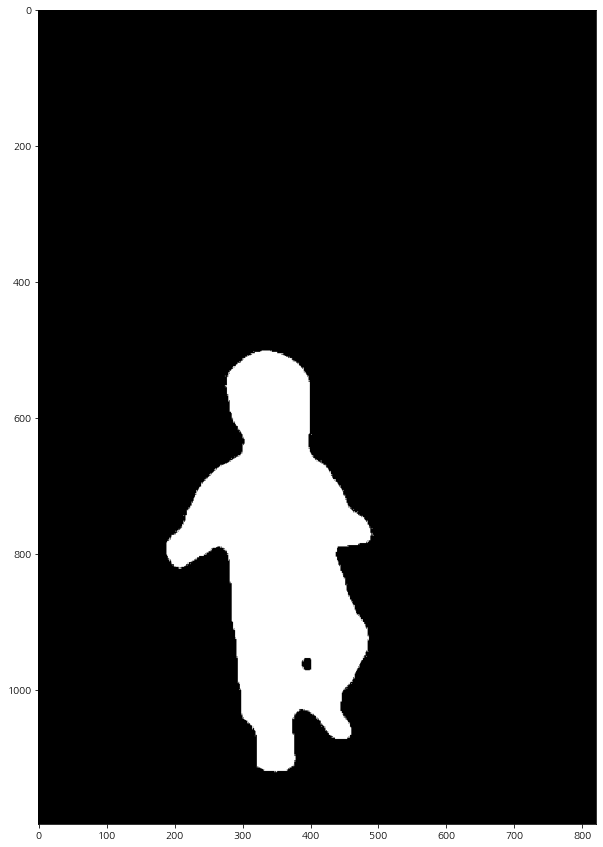

In [186]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
seg_map = np.all(output==seg_color, axis=-1)
print(seg_map.shape)
plt.figure(figsize=(10,20))
plt.imshow(seg_map, cmap='gray')
plt.show()

(631, 449, 3)


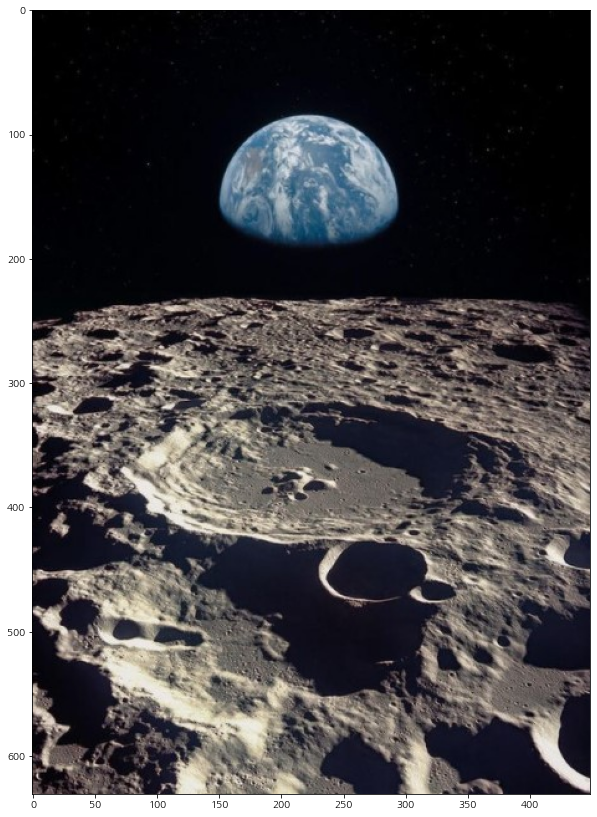

In [187]:
img_path = os.getenv('HOME')+'/aiffel/human_segmentation/images/moon.png'  
img_back = cv2.imread(img_path) 

print(img_back.shape)
plt.figure(figsize=(10,20))
plt.imshow(cv2.cvtColor(img_back, cv2.COLOR_BGR2RGB))
plt.show()

In [188]:
#두 이미지의 사이즈를 맞춰준다

h, w = img_mask.shape[ : 2]  

img_back = cv2.resize(img_back, (w,h), cv2.INTER_AREA)
print(img_mask.shape)
print(img_back.shape)


(1198, 821)
(1198, 821, 3)


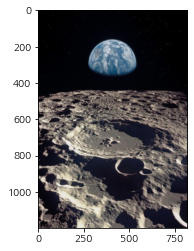

In [189]:

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_back, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_back, cv2.COLOR_BGR2RGB))
plt.show()

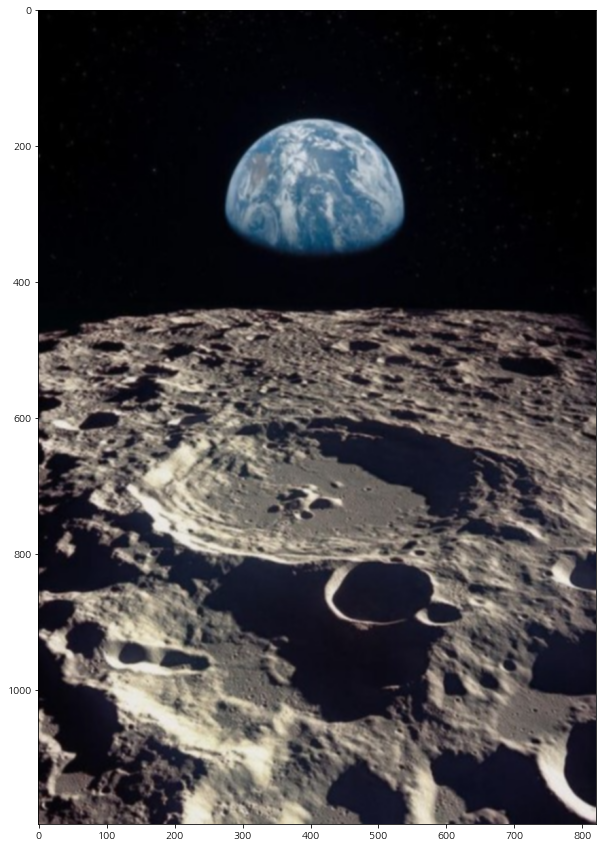

In [190]:
img_orig_blur = cv2.blur(img_back, (3,3))  
plt.figure(figsize=(10,20))
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

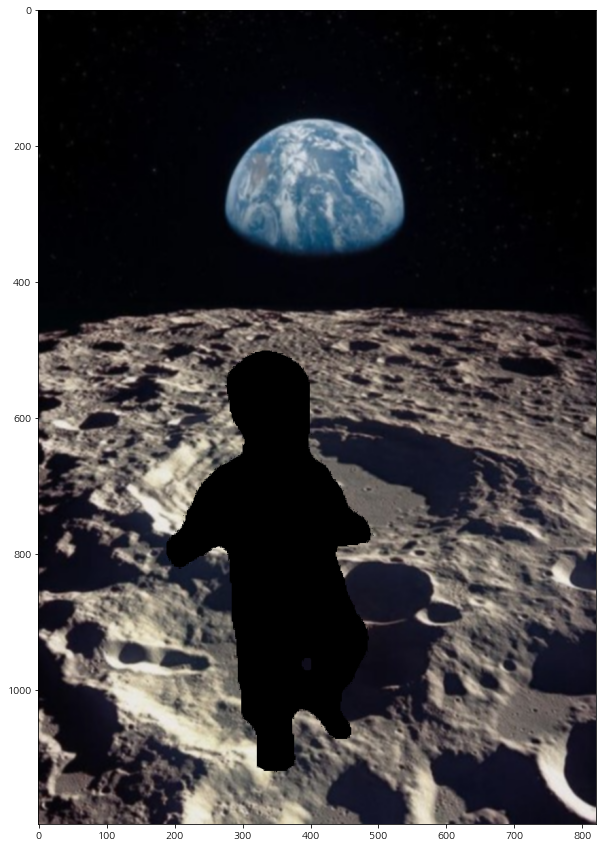

In [191]:
"""
bitwise_and  - mask 영역에서 서로 공통으로 겹치는 부분 출력
bitwise_or - mask 영역의 두 이미지를 합쳐버림
bitsise_xor - 모두 해당되거나 모두 해당되지 않는 영역을 제외한 부분. 한 이미지만 mask 영역인  부분 채택. 
bitwise_not  - 이미지 반전시켜줌. not을 쓰는 경우에는 이미지를 한개만 넣어준다.

"""



img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
img_bg_mask = cv2.bitwise_not(img_mask_color)
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.figure(figsize=(10,20))
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

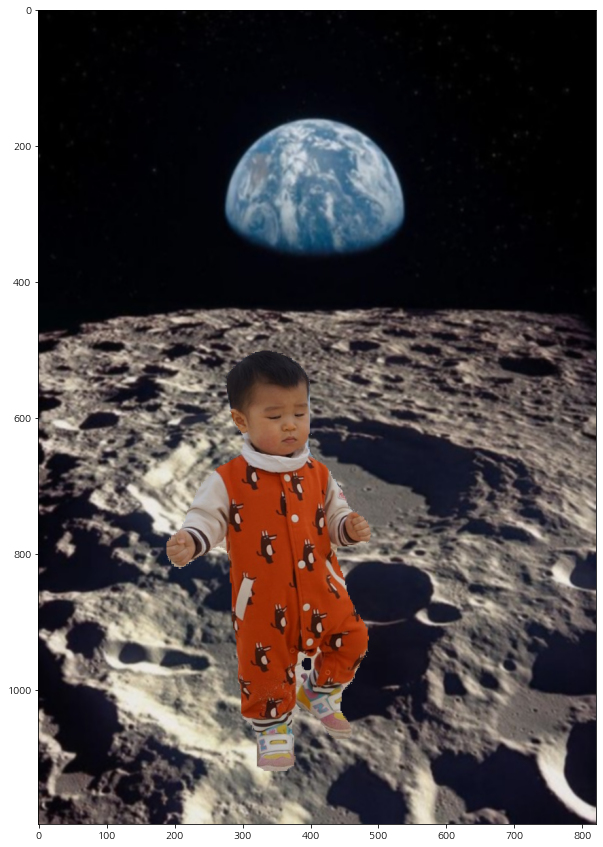

In [192]:
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
plt.figure(figsize=(10,20))
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))

plt.show()

회고: 
    
실습 1) 노드 내용을 자전거 타는 사진에 적용해보았다. 경계가 꺽어지거나 뾰족하게 튀어나온 곳은 마스크 정확도가 떨어진다. 이미지 안에 한글 코멘트를 넣기 위해 한글 폰트를 설정해주었다. 

실습 2) 여행이 가고 싶은 마음에 예전 여행 사진을 사용해보았다. 경계가 뭉그러지는 현상 때문에 blur 값을 20,20 으로 높게 주었더니 배경과 더 따로 노는 느낌이 들었다. </br>

실습 3) 달리는 고양이 사진을 활용. 속도감이 느껴지게 배경을 처리했다. </br>

실습 4) 우리 아기 첫 걸음마 하는 사진과 달 표면 사진을 합성해보았다. 아기 걸음마하는 모습에 마치 닐암스트롱이 달에 처음 간 느낌을 담아.. 합성을 위해 cv2.resize를 사용하여 두 이미지 크기를 맞추어주었다. 


한계: 

실습 1 이미지에 표시한 것 처럼 경계면이 정확하지 않아 필요한 부분이 잘리거나 필요없는 부분이 마스크에 포함되어 정확성이 떨어졌다. 
blur 처리는 low-pass-filter 로 경계가 뭉개지는 결과가 나오는 것 같다. 반대로 high-pass-filter는 edge 를 두드러지게 처리해주는데 
찾아보니 가우시안 필터에 대한 내용이 보였다.  정확히 내용이 이해는 안가지만 가우시안 필터로 edge가 두드러지게 처리한 후에 
segmentAsPascalvoc 처리를 하면 더 나은 결과가 나올지 모르겠다. 
GaussianFilterHigh  = 1 - exp((-x.^2/(2*sigma^2)-y.^2/(2*sigma^2)))

자전거 타는 사진 결과를 보고 생각한 또 한가지 한계는, 
사람과 함께 움직이는 사물의 데이터가 학습되어 있는 데이터셋을 사용해야 이미지가 결함이  없을 것 같다. 실습 1번 사진에서 사람과 자전거 자동차를 
인식하여 클래스 id 2번 7번 15번이 나왔다. 자동차는 주차가 되어 있고 자전거는 사람과 함께 움직이는 사물이라고 한다면 사람과 함께 자전거 영역도 
마스크를 함께 잡아서 처리가 되어야 자연스럽게 보일 것 이다. 이런 경우를 생각해보면, 사물을 인식만 하는 것이 아니라 처리 까지 하려면 사물간의 거리에 대한 
감지도 필요하다고 생각이 든다. (3D 카메라 이미지를 활용하기 등). 
